In [1]:
import sys
import numpy as np
import time
import sys, os
os.environ["CUDA_VISIBLE_DEVICES"]="1"

import random
import gc
import scipy.ndimage as ndimage
from skimage.transform import resize
import matplotlib.pyplot as plt

from deepmass import map_functions as mf
from deepmass import lens_data as ld
from deepmass import wiener
from deepmass import cnn_keras as cnn

plt.rcParams['image.cmap'] = 'coolwarm'


In [119]:
import numpy as np
import tensorflow.keras as keras
from tensorflow.keras.layers import Input, Dropout, Conv2D, MaxPooling2D, UpSampling2D, add, BatchNormalization, Conv2DTranspose
from tensorflow.keras.layers import concatenate, AveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import Callback
from tensorflow.keras.optimizers import Adam


class UnetlikeBaseline_new:
    """
    A CNN class that creates a denoising Unet
    """

    def __init__(self, map_size, learning_rate, channels, dropout_val=None):
        """
        Initialisation
        :param map_size: size of square image (there are map_size**2 pixels)
        :param learning_rate: learning rate for the optimizer
        """
        self.map_size = map_size
        self.learning_rate = learning_rate
        self.dropout_val = dropout_val
        self.channels = channels

        if dropout_val is not None:
            print('using dropout: ' + str(dropout_val))

    def model(self):
        input_img = Input(shape=(self.map_size, self.map_size, self.channels[0]))

        x1 = Conv2D(16, 3, activation='relu', padding='same', kernel_initializer='he_normal')(input_img)
        x1 = BatchNormalization()(x1)

        pool1 = AveragePooling2D(pool_size=(2, 2))(x1)
        x2 = Conv2D(32, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool1)
        x2 = BatchNormalization()(x2)

        pool2 = AveragePooling2D(pool_size=(2, 2))(x2)
        x3 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool2)
        x3 = BatchNormalization()(x3)

        pool3 = AveragePooling2D(pool_size=(2, 2))(x3)
        x4 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool3)
        x4 = BatchNormalization()(x4)

        pool_deep = AveragePooling2D(pool_size=(2, 2))(x4)
        xdeep = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool_deep)
        xdeep = BatchNormalization()(xdeep)

        updeep = UpSampling2D((2, 2))(xdeep)
        mergedeep = concatenate([x4, updeep], axis=3)

        xdeep2 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(mergedeep)
        xdeep2 = BatchNormalization()(xdeep2)

        up5 = UpSampling2D((2, 2))(xdeep2)
        merge5 = concatenate([x3, up5], axis=3)
        merge5 = BatchNormalization()(merge5)

        x5 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(merge5)

        up6 = UpSampling2D((2, 2))(x5)
        merge6 = concatenate([x2, up6], axis=3)
        merge6 = BatchNormalization()(merge6)

        x6 = Conv2D(32, 3, activation='relu', padding='same', kernel_initializer='he_normal')(merge6)

        up7 = UpSampling2D((2, 2))(x6)
        merge7 = concatenate([x1, up7], axis=3)
        merge7 = BatchNormalization()(merge7)

        x7 = Conv2D(16, 3, activation='relu', padding='same', kernel_initializer='he_normal')(merge7)
        output = Conv2D(self.channels[1], 1, activation='sigmoid')(x7)

        unet = Model(input_img, output)
        unet.summary()

        if self.learning_rate is None:
            unet.compile(optimizer='adam', loss='mse')
        else:
            unet.compile(optimizer=Adam(lr=self.learning_rate), loss='mse')

        return unet

In [3]:
import tensorflow as tf
tf.config.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [126]:
map_size = 256
n_test = int(2000)
n_epoch = 50
batch_size = 400
learning_rate = 1e-4

# Calculate normalization values (Q,U mean and std)

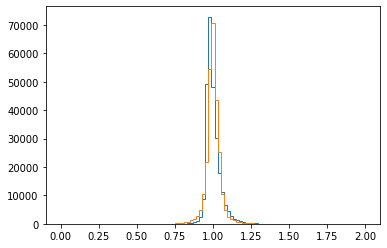

In [5]:
target= np.load('../../polarized_synthesis/data/sim_QiU_stdr_3.npy')
meanQ = np.mean(target.real)
stdQ = np.std(target.real)
meanU = np.mean(target.imag)
stdU = np.std(target.imag)
target = (target.real - meanQ)/(stdQ*20) + 1. + 1j*(target.imag - meanU)/(stdU*20) + 1j

_ = plt.hist(target.real.flatten(), histtype='step', bins=np.linspace(0,2,100))
_ = plt.hist(target.imag.flatten(), histtype='step', bins=np.linspace(0,2,100))

# Load files and normalize

In [6]:
files = [filename for filename in os.listdir('../../polarized_synthesis/long_run/') if '.npy' in filename]
print(files)
nfiles=len(files)
print(nfiles)

['long_run103npy.npy', 'long_run216npy.npy', 'long_run200npy.npy', 'long_run2npy.npy', 'long_run240npy.npy', 'long_run115npy.npy', 'long_run237npy.npy', 'long_run221npy.npy', 'long_run214npy.npy', 'long_run15npy.npy', 'long_run101npy.npy', 'long_run219npy.npy', 'long_run242npy.npy', 'long_run0npy.npy', 'long_run202npy.npy', 'long_run235npy.npy', 'long_run238npy.npy', 'long_run223npy.npy', 'long_run111npy.npy', 'long_run244npy.npy', 'long_run204npy.npy', 'long_run6npy.npy', 'long_run212npy.npy', 'long_run209npy.npy', 'long_run107npy.npy', 'long_run13npy.npy', 'long_run249npy.npy', 'long_run225npy.npy', 'long_run233npy.npy', 'long_run228npy.npy', 'long_run4npy.npy', 'long_run206npy.npy', 'long_run108npy.npy', 'long_run246npy.npy', 'long_run113npy.npy', 'long_run11npy.npy', 'long_run105npy.npy', 'long_run9npy.npy', 'long_run210npy.npy', 'long_run227npy.npy', 'long_run231npy.npy', 'long_run232npy.npy', 'long_run229npy.npy', 'long_run224npy.npy', 'long_run213npy.npy', 'long_run12npy.npy', '

0
8
16
24
32
40
48
56
64
72
80


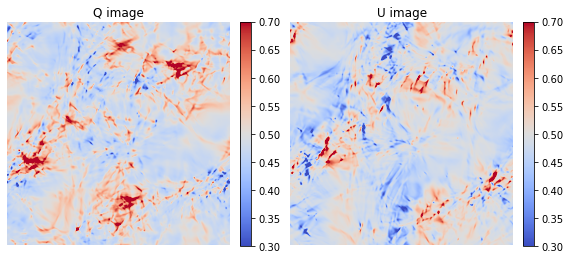

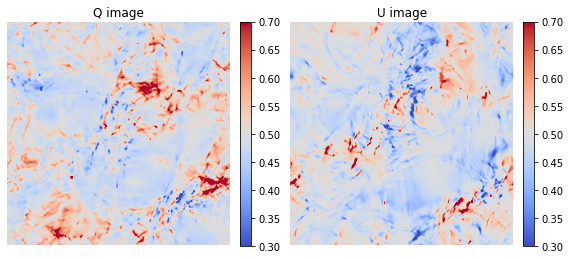

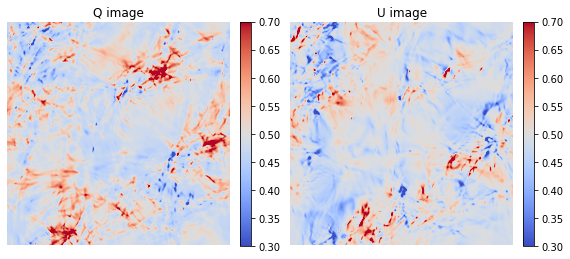

In [7]:
input_foreground_array = np.empty((nfiles,512,512,2))
for i in range(nfiles):
    temp_map = np.load('../../polarized_synthesis/long_run/' + files[i])
    input_foreground_array[i,:,:,0] = (temp_map.real- meanQ)/(stdQ*20.) +1.
    input_foreground_array[i,:,:,1] = (temp_map.imag- meanU)/(stdU*20.) +1. 
    
for i in range(input_foreground_array.shape[0]):
    
    if i%(int(input_foreground_array.shape[0]/10))==0: print(i, flush=True)
        
    input_foreground_array[i,:,:,0] = ndimage.gaussian_filter(input_foreground_array[i,:,:,0], 1)
    input_foreground_array[i,:,:,1] = ndimage.gaussian_filter(input_foreground_array[i,:,:,1], 1)
    
for i in range(3):
    _ = plt.figure(figsize=(8,4))
    _ = plt.subplot(1,2,1), plt.imshow(input_foreground_array[i,:,:,0]-0.5,
                                       clim=(0.3,0.7),
                                       interpolation='spline16', cmap = 'coolwarm')
    _ = plt.title('Q image'), plt.colorbar(fraction=0.046, pad=0.04)
    _ = plt.axis('off')
    _ = plt.subplot(1,2,2), plt.imshow(input_foreground_array[i,:,:,1]-0.5,
                                       clim=(0.3,0.7),
                                       interpolation='spline16', cmap = 'coolwarm')
    _ = plt.title('U image'), plt.colorbar(fraction=0.046, pad=0.04)
    _ = plt.axis('off')
    _ = plt.tight_layout(True), plt.show()

# Replicate 3 rotations of original images & then do flip

In [8]:
rotated_foreground_array  = np.vstack([tf.image.rot90(input_foreground_array, k = i) for i in range(4)])
print(rotated_foreground_array.shape)

rotated_foreground_array = np.concatenate([rotated_foreground_array,
                                           tf.image.transpose(rotated_foreground_array)]).astype(np.float32)
print(rotated_foreground_array.shape)
gc.collect()

(328, 512, 512, 2)
(656, 512, 512, 2)


27814

## Test rotation

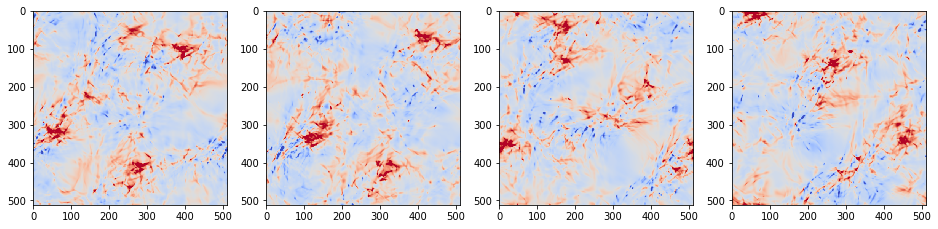

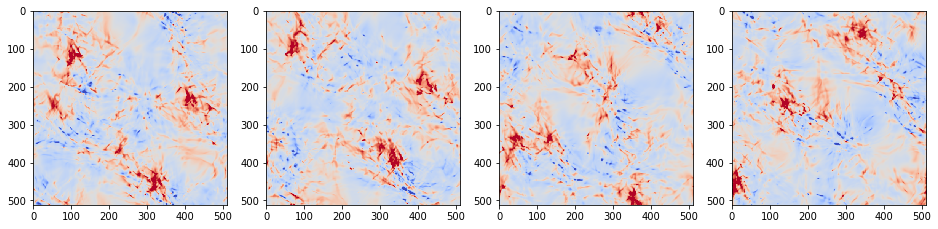

In [9]:
plt.figure(figsize=(16,4))
for i in range(4):
    plt.subplot(1,4,i+1)
    plt.imshow(rotated_foreground_array[i*20,:,:,0], clim=(0.8,1.2))
plt.show()

plt.figure(figsize=(16,4))
for i in range(4):
    plt.subplot(1,4,i+1)
    plt.imshow(rotated_foreground_array[i*20+input_foreground_array.shape[0],:,:,0], clim=(0.8,1.2))
plt.show()

## Test flip

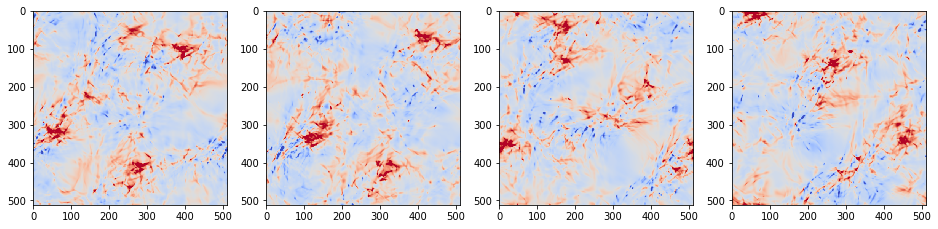

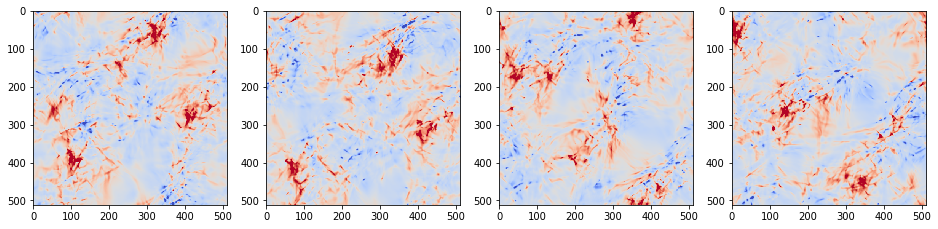

In [10]:
plt.figure(figsize=(16,4))
for i in range(4):
    plt.subplot(1,4,i+1)
    plt.imshow(rotated_foreground_array[i*20,:,:,0], clim=(0.8,1.2))
plt.show()

plt.figure(figsize=(16,4))
for i in range(4):
    plt.subplot(1,4,i+1)
    plt.imshow(rotated_foreground_array[i*20+int(0.5*rotated_foreground_array.shape[0]),:,:,0],
               clim=(0.8,1.2))
plt.show()

# Stride patches

In [12]:
n_step = 8
grid_step = np.meshgrid(np.linspace(0,map_size*2,n_step+1, dtype=int)[:-1],
                        np.linspace(0,map_size*2,n_step+1, dtype=int)[:-1])
grid_i_index = grid_step[0].flatten()
grid_j_index = grid_step[1].flatten()

noisy_array = np.empty((len(grid_i_index)*rotated_foreground_array.shape[0], map_size,map_size,2), dtype=np.float32)
print(noisy_array.shape)

for i in range(len(grid_i_index)):
    low_lim = i*rotated_foreground_array.shape[0]
    high_lim = (i+1)*rotated_foreground_array.shape[0]
    noisy_array[low_lim:high_lim] = np.roll(np.roll(rotated_foreground_array, shift=grid_i_index[i],axis=1),
                                            shift=grid_j_index[i],axis=2)[:,:int(map_size),:int(map_size),:]
    print(grid_i_index[i], grid_j_index[i])


random_indices = np.arange(noisy_array.shape[0])
np.random.shuffle(random_indices)

noisy_array = noisy_array[random_indices]

(41984, 256, 256, 2)
0 0
64 0
128 0
192 0
256 0
320 0
384 0
448 0
0 64
64 64
128 64
192 64
256 64
320 64
384 64
448 64
0 128
64 128
128 128
192 128
256 128
320 128
384 128
448 128
0 192
64 192
128 192
192 192
256 192
320 192
384 192
448 192
0 256
64 256
128 256
192 256
256 256
320 256
384 256
448 256
0 320
64 320
128 320
192 320
256 320
320 320
384 320
448 320
0 384
64 384
128 384
192 384
256 384
320 384
384 384
448 384
0 448
64 448
128 448
192 448
256 448
320 448
384 448
448 448


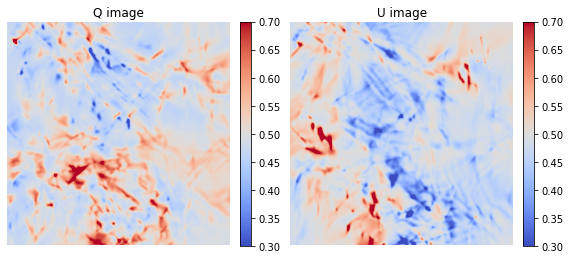

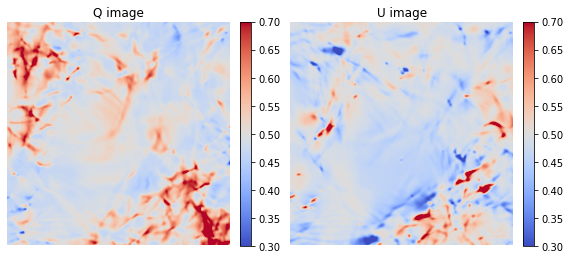

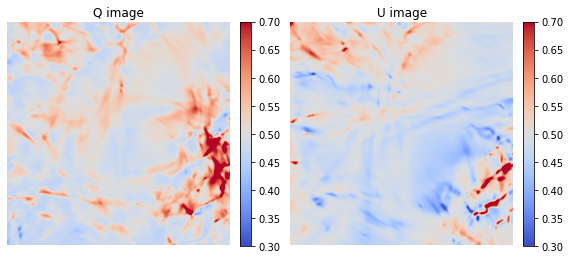

In [13]:
for i in range(3):
    _ = plt.figure(figsize=(8,4))
    _ = plt.subplot(1,2,1), plt.imshow(noisy_array[i,:,:,0]-0.5,
                                       clim=(0.3,0.7),
                                       interpolation='spline16', cmap = 'coolwarm')
    _ = plt.title('Q image'), plt.colorbar(fraction=0.046, pad=0.04)
    _ = plt.axis('off')
    _ = plt.subplot(1,2,2), plt.imshow(noisy_array[i,:,:,1]-0.5,
                                       clim=(0.3,0.7),
                                       interpolation='spline16', cmap = 'coolwarm')
    _ = plt.title('U image'), plt.colorbar(fraction=0.046, pad=0.04)
    _ = plt.axis('off')
    _ = plt.tight_layout(True), plt.show()

# Signal

In [14]:
files = sorted(os.listdir('../../polarized_synthesis/data/cmb_signal/maps/'))
full_path_files = [('../../polarized_synthesis/data/cmb_signal/maps/' + file) for file in files if '.npy' in file]
print(len(full_path_files))

n_files = noisy_array.shape[0]
clean_array = np.stack([np.load(f).transpose(1,2,0) for f in full_path_files[:n_files]])[:,:,:,:2]
gc.collect()

43200


61443

In [15]:
clean_array[:,:,:,0] = (clean_array[:,:,:,0]-np.mean(clean_array[:,:,:,0]))/(30.*np.std(clean_array[:,:,:,0]))
clean_array[:,:,:,1] = (clean_array[:,:,:,1]-np.mean(clean_array[:,:,:,1]))/(30.*np.std(clean_array[:,:,:,1]))

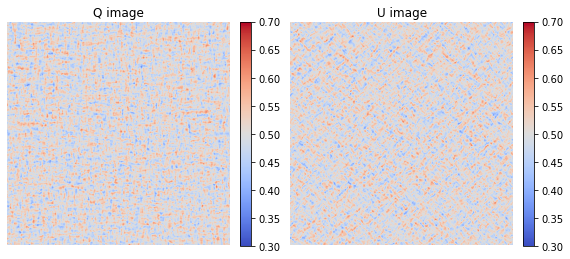

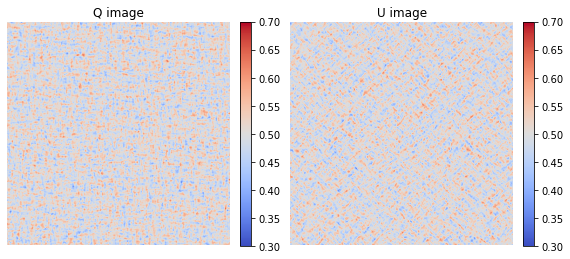

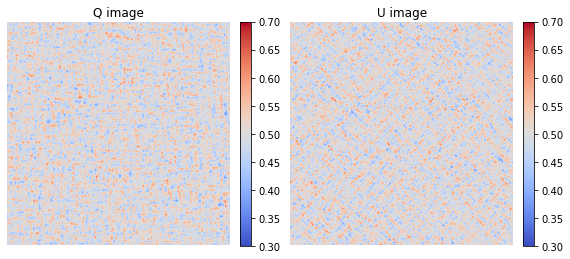

In [16]:
for i in range(3):
    _ = plt.figure(figsize=(8,4))
    _ = plt.subplot(1,2,1), plt.imshow(clean_array[i,:,:,0]+0.5,
                                       clim=(0.3,0.7),
                                       interpolation='spline16', cmap = 'coolwarm')
    _ = plt.title('Q image'), plt.colorbar(fraction=0.046, pad=0.04)
    _ = plt.axis('off')
    _ = plt.subplot(1,2,2), plt.imshow(clean_array[i,:,:,1]+0.5,
                                       clim=(0.3,0.7),
                                       interpolation='spline16', cmap = 'coolwarm')
    _ = plt.title('U image'), plt.colorbar(fraction=0.046, pad=0.04)
    _ = plt.axis('off')
    _ = plt.tight_layout(True), plt.show()

# Generate data

In [17]:
for i in range(clean_array.shape[0]):
    if i%(int(clean_array.shape[0]/10))==0: print(i, flush=True)
    random_amplitude = np.random.normal(1,0.1)
    clean_array[i,:,:,0] = ndimage.gaussian_filter(clean_array[i,:,:,0], 1)*random_amplitude + 0.5
    clean_array[i,:,:,1] = ndimage.gaussian_filter(clean_array[i,:,:,1], 1)*random_amplitude + 0.5
    
gc.collect()

noisy_array = noisy_array[:n_files] + clean_array - 1.

test_array_noisy = noisy_array[:n_test]
test_array_clean = clean_array[:n_test] 
gc.collect()

noisy_array = noisy_array[n_test:]
clean_array = clean_array[n_test:]
gc.collect()

0
4198
8396
12594
16792
20990
25188
29386
33584
37782
41980


0

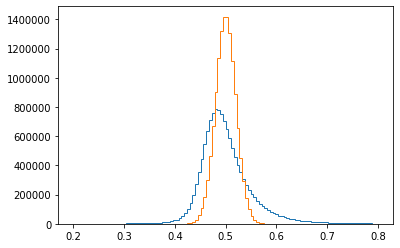

In [20]:
_ = plt.hist(noisy_array[:200,:,:,0].flatten(), bins=np.linspace(0.2,0.8,111), histtype='step')
_ = plt.hist(clean_array[:200,:,:,0].flatten(), bins=np.linspace(0.2,0.8,111), histtype='step')

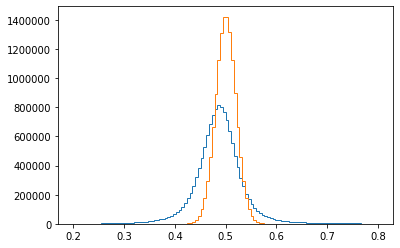

In [21]:
_ = plt.hist(noisy_array[:200,:,:,1].flatten(), bins=np.linspace(0.2,0.8,111), histtype='step')
_ = plt.hist(clean_array[:200,:,:,1].flatten(), bins=np.linspace(0.2,0.8,111), histtype='step')

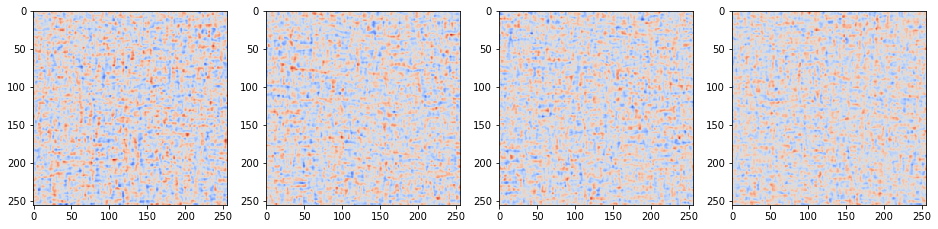

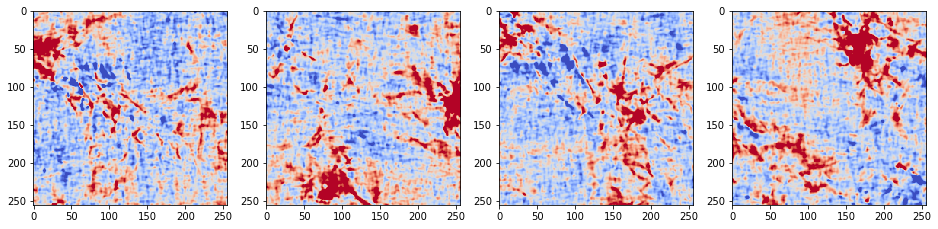

In [26]:
plt.figure(figsize=(16,4))
for i in range(4):
    plt.subplot(1,4,i+1), plt.imshow(clean_array.real[i*20,:,:,0], clim=(0.4, 0.6))
plt.show()

plt.figure(figsize=(16,4))
for i in range(4):
    plt.subplot(1,4,i+1), plt.imshow(noisy_array.real[i*20,:,:,0], clim=(0.4,0.6))
plt.show()

# Train

In [128]:
train_gen = cnn.BatchGenerator(noisy_array, clean_array[:,:,:,0], gen_batch_size=batch_size)
test_gen = cnn.BatchGenerator(test_array_noisy, test_array_clean[:,:,:,0], gen_batch_size=batch_size)

cnn_instance = UnetlikeBaseline_new(map_size=map_size, learning_rate=learning_rate, channels=[2,1])
cnn_model = cnn_instance.model()

Model: "model_10"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_11 (InputLayer)           [(None, 256, 256, 2) 0                                            
__________________________________________________________________________________________________
conv2d_100 (Conv2D)             (None, 256, 256, 16) 304         input_11[0][0]                   
__________________________________________________________________________________________________
batch_normalization_90 (BatchNo (None, 256, 256, 16) 64          conv2d_100[0][0]                 
__________________________________________________________________________________________________
average_pooling2d_40 (AveragePo (None, 128, 128, 16) 0           batch_normalization_90[0][0]     
___________________________________________________________________________________________

In [129]:
history = cnn_model.fit_generator(generator=train_gen,
                         epochs=n_epoch,
                         steps_per_epoch=np.ceil(noisy_array.shape[0] / int(batch_size)),
                         validation_data=test_gen,
                         validation_steps=np.ceil(test_array_noisy.shape[0] / int(batch_size)), verbose=True)

gc.collect()

Epoch 1/50


ResourceExhaustedError:  OOM when allocating tensor with shape[400,48,256,256] and type float on /job:localhost/replica:0/task:0/device:GPU:0 by allocator GPU_0_bfc
	 [[node gradient_tape/model_10/conv2d_108/Conv2D/Conv2DBackpropInput (defined at <ipython-input-129-7c16c3f5f5fd>:5) ]]
Hint: If you want to see a list of allocated tensors when OOM happens, add report_tensor_allocations_upon_oom to RunOptions for current allocation info.
 [Op:__inference_train_function_44619]

Function call stack:
train_function


In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.yscale('log')

In [34]:
test_output = cnn_model.predict(noisy_array[10000:10005])

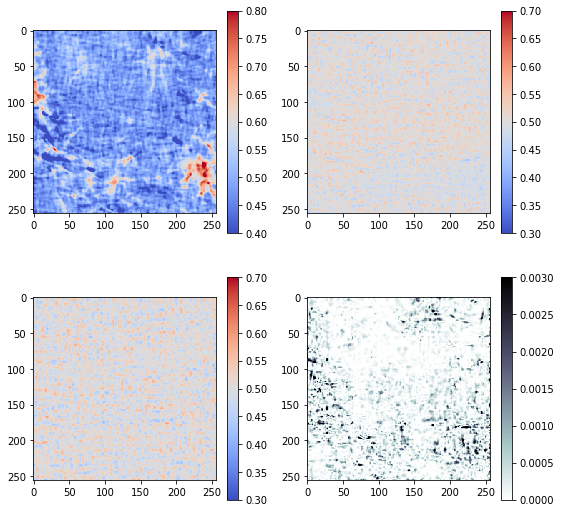

In [35]:
_ = plt.figure(figsize=(9,9))
_ = plt.subplot(221), plt.imshow(noisy_array[10000,:,:,0], clim=(0.4,0.8)), plt.colorbar()
_ = plt.subplot(222), plt.imshow(test_output[0,:,:,0], clim=(0.3,0.7)), plt.colorbar()
_ = plt.subplot(223), plt.imshow(clean_array[10000,:,:,0], clim=(0.3,0.7)), plt.colorbar()
_ = plt.subplot(224), plt.imshow((clean_array[10000,:,:,0]-test_output[0,:,:,0])**2, clim=(0,3e-3), cmap='bone_r')
_ = plt.colorbar()

68.51882219314575


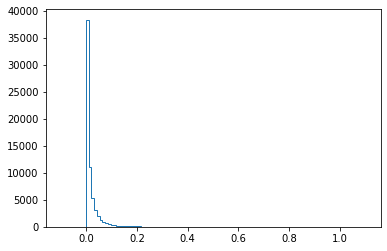

In [36]:
t = time.time()
predict_batch = 400
target_var = np.vstack([cnn_model.predict(noisy_array[i*predict_batch:(i+1)*predict_batch]) 
                        for i in range(100)])

print(time.time() - t, flush=True)
target_var = 100*(target_var - clean_array)**2.

_ = plt.hist(target_var[0,:,:,0].flatten(),bins=np.linspace(-0.1,1.1,111), histtype='step')

In [37]:
train_gen_var = cnn.BatchGenerator(noisy_array[:10000], target_var[:10000], gen_batch_size=batch_size)
test_gen_var = cnn.BatchGenerator(noisy_array[10000:], target_var[10000:], gen_batch_size=batch_size)

cnn_instance_var = UnetlikeBaseline_new(map_size=map_size, learning_rate=learning_rate, channels=2)
cnn_model_var = cnn_instance_var.model()

Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 256, 256, 2) 0                                            
__________________________________________________________________________________________________
conv2d_30 (Conv2D)              (None, 256, 256, 16) 304         input_4[0][0]                    
__________________________________________________________________________________________________
batch_normalization_27 (BatchNo (None, 256, 256, 16) 64          conv2d_30[0][0]                  
__________________________________________________________________________________________________
average_pooling2d_12 (AveragePo (None, 128, 128, 16) 0           batch_normalization_27[0][0]     
____________________________________________________________________________________________

In [42]:
history_var = cnn_model_var.fit_generator(generator=train_gen_var,
                         epochs=10,
                         steps_per_epoch=np.ceil(noisy_array[:10000].shape[0] / int(batch_size)),
                         validation_data=test_gen_var,
                         validation_steps=np.ceil(noisy_array[10000:].shape[0] / int(batch_size)), verbose=True)

gc.collect()

Epoch 1/10
79/79 [==============================] - 65s 821ms/step - loss: 0.1373 - val_loss: 0.0302
Epoch 2/10
79/79 [==============================] - 62s 792ms/step - loss: 0.0119 - val_loss: 0.0046
Epoch 3/10
79/79 [==============================] - 81s 1s/step - loss: 0.0053 - val_loss: 0.0029
Epoch 4/10
79/79 [==============================] - 110s 1s/step - loss: 0.0040 - val_loss: 0.0030
Epoch 5/10
79/79 [==============================] - 113s 1s/step - loss: 0.0036 - val_loss: 0.0033
Epoch 6/10
79/79 [==============================] - 109s 1s/step - loss: 0.0035 - val_loss: 0.0034
Epoch 7/10
79/79 [==============================] - 112s 1s/step - loss: 0.0034 - val_loss: 0.0034
Epoch 8/10
79/79 [==============================] - 114s 1s/step - loss: 0.0033 - val_loss: 0.0033
Epoch 9/10
79/79 [==============================] - 118s 2s/step - loss: 0.0033 - val_loss: 0.0033
Epoch 10/10
79/79 [==============================] - 118s 2s/step - loss: 0.0033 - val_loss: 0.0032


35399

In [44]:
test_var = cnn_model_var.predict(noisy_array[10000:10002])

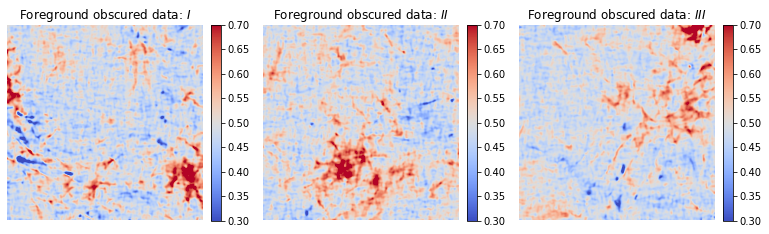

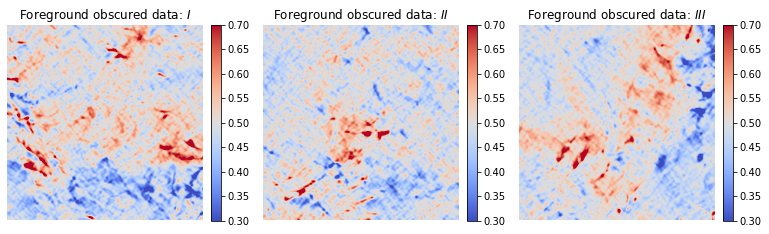

In [43]:
_ = plt.figure(figsize=(13,5))
_ = plt.subplot(1,3,1), plt.imshow(noisy_array[10000,:,:,0], clim=(0.3,0.7),
                                   interpolation='spline16', cmap = 'coolwarm')
_ = plt.title(r'Foreground obscured data: $I$'), plt.colorbar(fraction=0.046, pad=0.04)
_ = plt.axis('off')
_ = plt.subplot(1,3,2), plt.imshow(noisy_array[10001,:,:,0], clim=(0.3,0.7),
                                   interpolation='spline16', cmap = 'coolwarm')
_ = plt.title(r'Foreground obscured data: $II$'), plt.colorbar(fraction=0.046, pad=0.04)
_ = plt.axis('off')
_ = plt.subplot(1,3,3), plt.imshow(noisy_array[10002,:,:,0], clim=(0.3,0.7),
                                   interpolation='spline16',cmap = 'coolwarm')
_ = plt.title(r'Foreground obscured data: $III$'), plt.colorbar(fraction=0.046, pad=0.04)
_ = plt.axis('off')
_ = plt.savefig('foreground_data_examples_Q1.png', dpi=300)

_ = plt.figure(figsize=(13,5))
_ = plt.subplot(1,3,1), plt.imshow(noisy_array[10000,:,:,1], clim=(0.3,0.7),
                                   interpolation='spline16', cmap = 'coolwarm')
_ = plt.title(r'Foreground obscured data: $I$'), plt.colorbar(fraction=0.046, pad=0.04)
_ = plt.axis('off')
_ = plt.subplot(1,3,2), plt.imshow(noisy_array[10001,:,:,1], clim=(0.3,0.7),
                                   interpolation='spline16', cmap = 'coolwarm')
_ = plt.title(r'Foreground obscured data: $II$'), plt.colorbar(fraction=0.046, pad=0.04)
_ = plt.axis('off')
_ = plt.subplot(1,3,3), plt.imshow(noisy_array[10002,:,:,1], clim=(0.3,0.7),
                                   interpolation='spline16',cmap = 'coolwarm')
_ = plt.title(r'Foreground obscured data: $III$'), plt.colorbar(fraction=0.046, pad=0.04)
_ = plt.axis('off')
_ = plt.savefig('foreground_data_examples_U1.png', dpi=300)

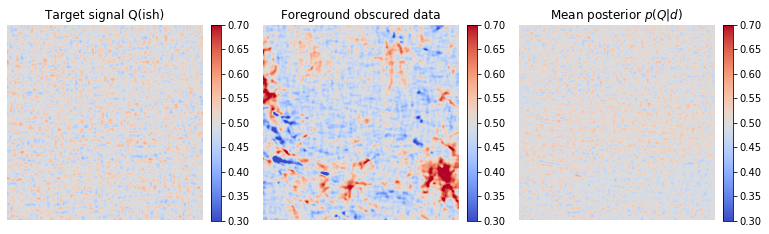

In [45]:
_ = plt.figure(figsize=(13,5))
_ = plt.subplot(1,3,1), plt.imshow(clean_array[10000,:,:,0], clim=(0.3,0.7),
                                   interpolation='spline16', cmap = 'coolwarm')
_ = plt.title('Target signal Q(ish)'), plt.colorbar(fraction=0.046, pad=0.04)
_ = plt.axis('off')
_ = plt.subplot(1,3,2), plt.imshow(noisy_array[10000,:,:,0], clim=(0.3,0.7),
                                   interpolation='spline16', cmap = 'coolwarm')
_ = plt.title('Foreground obscured data'), plt.colorbar(fraction=0.046, pad=0.04)
_ = plt.axis('off')
_ = plt.subplot(1,3,3), plt.imshow(test_output[0,:,:,0], clim=(0.3,0.7),
                                   interpolation='spline16',cmap = 'coolwarm')
_ = plt.title('Mean posterior $p(Q | d)$'), plt.colorbar(fraction=0.046, pad=0.04)
_ = plt.axis('off')
_ = plt.savefig('reconstruction_pol_QU.png', dpi=300)

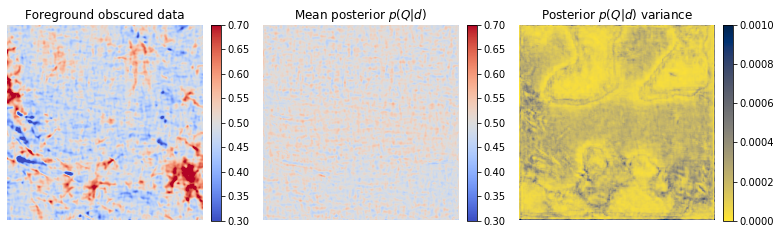

In [46]:
_ = plt.figure(figsize=(13,5))
_ = plt.subplot(1,3,1),  plt.imshow(noisy_array[10000,:,:,0], clim=(0.3,0.7),
                                   interpolation='spline16', cmap = 'coolwarm')
_ = plt.title('Foreground obscured data'), plt.colorbar(fraction=0.046, pad=0.04)
_ = plt.axis('off')
_ = plt.subplot(1,3,2), plt.imshow(test_output[0,:,:,0], clim=(0.3,0.7),
                                   interpolation='spline16',cmap = 'coolwarm')
_ = plt.title('Mean posterior $p(Q | d)$'), plt.colorbar(fraction=0.046, pad=0.04)
_ = plt.axis('off')
_ = plt.subplot(1,3,3), plt.imshow(test_var[0,:,:,0]/100., clim = (0.,1e-3),interpolation='spline16', cmap = 'cividis_r')
_ = plt.title('Posterior $p(Q | d)$ variance'), plt.colorbar(fraction=0.046, pad=0.04)
_ = plt.axis('off')
_ = plt.savefig('reconstruction_var_pol_QU.png', dpi=300)

# Load examples

In [95]:
from astropy.io import fits

In [96]:
Q_alt = np.array(fits.open('../../polarized_synthesis/data/alternative/Q_y0_z_output_00071.fits')[0].data).astype(np.float32)
U_alt = np.array(fits.open('../../polarized_synthesis/data/alternative/U_y0_z_output_00071.fits')[0].data).astype(np.float32)

In [102]:
input_patch = np.stack([Q_alt, U_alt], axis=2)
input_patch = np.stack([input_patch[:256,:256],
                              input_patch[256:,:256],
                              input_patch[256:,256:],
                              input_patch[:256,256:]])

print(np.mean(Q_alt))

input_patch[:,:,:,0] = (input_patch[:,:,:,0] - np.mean(input_patch[:,:,:,0]))/(np.std(input_patch[:,:,:,0])*20.)
input_patch[:,:,:,1] = (input_patch[:,:,:,1] - np.mean(input_patch[:,:,:,1]))/(np.std(input_patch[:,:,:,1])*20.)
input_patch += 0.5

input_signal_example = np.reshape(test_array_clean[:4], (4,256,256,2))
input_patch_example = input_patch + input_signal_example - 0.5

0.009872015


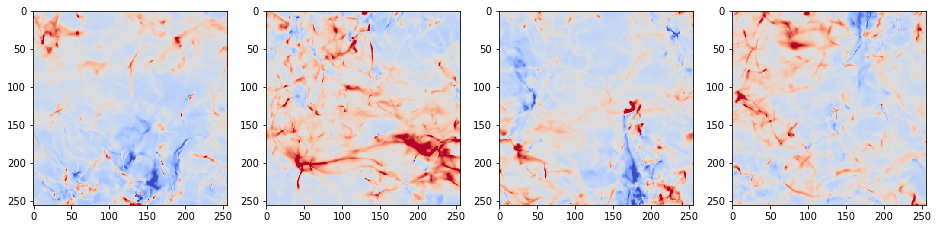

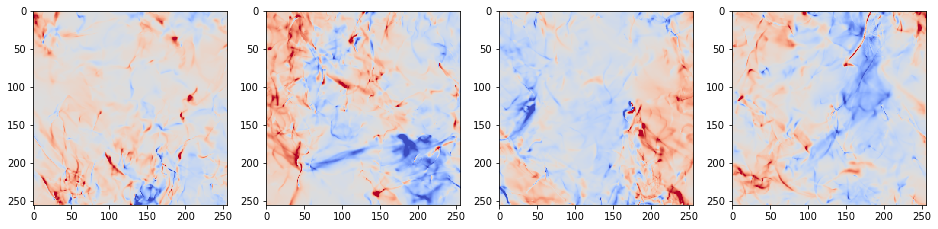

In [100]:
plt.figure(figsize=(16,4))
for i in range(4):
    plt.subplot(1,4,i+1), plt.imshow(input_patch[i,:,:,0], clim=(0.3,0.7))
plt.show()

plt.figure(figsize=(16,4))
for i in range(4):
    plt.subplot(1,4,i+1), plt.imshow(input_patch[i,:,:,1], clim=(0.3,0.7))
plt.show()

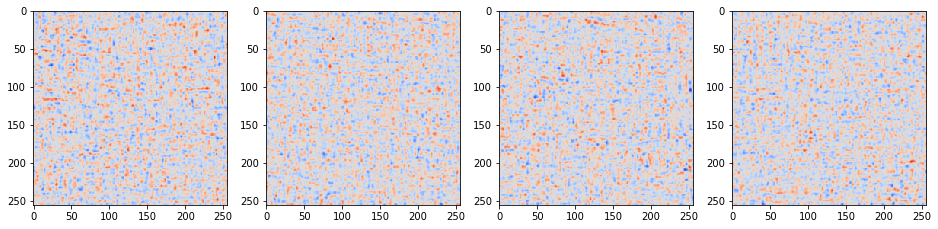

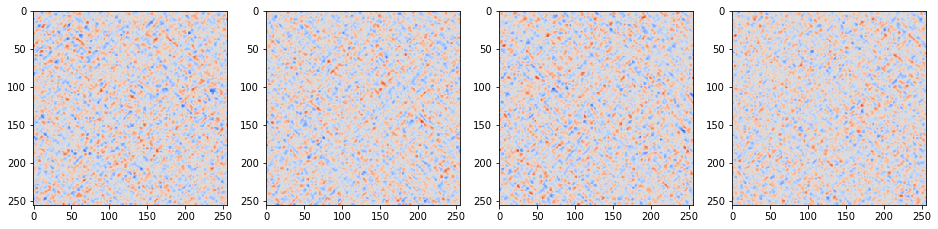

In [105]:
plt.figure(figsize=(16,4))
for i in range(4):
    plt.subplot(1,4,i+1), plt.imshow(input_signal_example[i,:,:,0], clim=(0.4,0.6))
plt.show()

plt.figure(figsize=(16,4))
for i in range(4):
    plt.subplot(1,4,i+1), plt.imshow(input_signal_example[i,:,:,1], clim=(0.4,0.6))
plt.show()

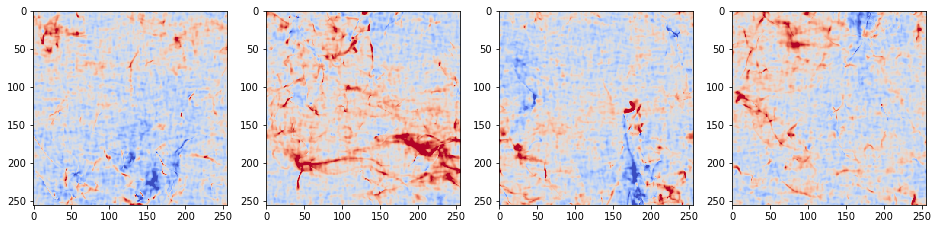

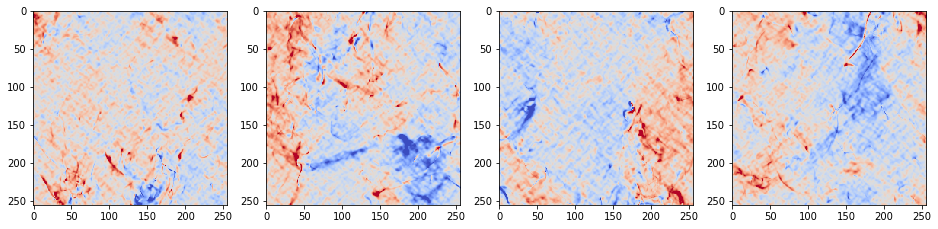

In [103]:
plt.figure(figsize=(16,4))
for i in range(4):
    plt.subplot(1,4,i+1), plt.imshow(input_patch_example[i,:,:,0], clim=(0.3,0.7))
plt.show()

plt.figure(figsize=(16,4))
for i in range(4):
    plt.subplot(1,4,i+1), plt.imshow(input_patch_example[i,:,:,1], clim=(0.3,0.7))
plt.show()

In [106]:
valid_output = cnn_model.predict(input_patch_example)
valid_var = cnn_model_var.predict(input_patch_example)

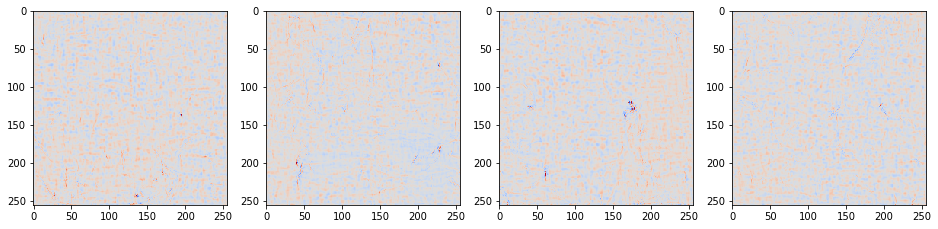

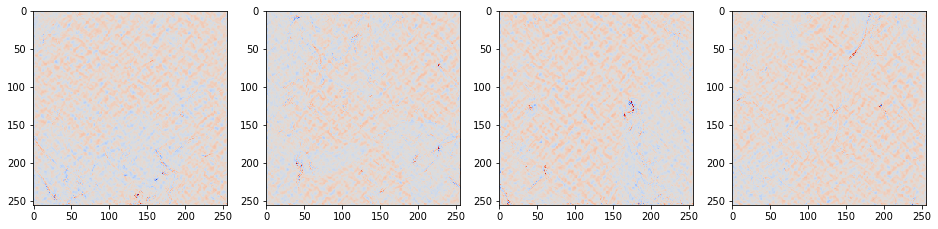

In [107]:
plt.figure(figsize=(16,4))
for i in range(4):
    plt.subplot(1,4,i+1), plt.imshow(valid_output[i,:,:,0], clim=(0.3,0.7))
plt.show()

plt.figure(figsize=(16,4))
for i in range(4):
    plt.subplot(1,4,i+1), plt.imshow(valid_output[i,:,:,1], clim=(0.3,0.7))
plt.show()